In [1]:
import pathlib
import sys

import matplotlib.pyplot as plt
import torch
import torchinfo
import torchvision
import ultralytics
from PIL import Image
from torchvision.transforms import v2
from ultralytics import YOLO

In [2]:
print("Platform:", sys.platform)
print("Python version:", sys.version)
print("---")
print("matplotlib version:", plt.matplotlib.__version__)
print("PIL version:", Image.__version__)
print("torch version:", torch.__version__)
print("torchvision version:", torchvision.__version__)
print("ultralytics version:", ultralytics.__version__)

Platform: win32
Python version: 3.13.2 (tags/v3.13.2:4f8bb39, Feb  4 2025, 15:23:48) [MSC v.1942 64 bit (AMD64)]
---
matplotlib version: 3.10.1
PIL version: 11.1.0
torch version: 2.7.1+cpu
torchvision version: 0.22.1+cpu
ultralytics version: 8.3.169


In [3]:
CLASS_DICT = dict(
    enumerate(
        [
            "ambulance",
            "army vehicle",
            "auto rickshaw",
            "bicycle",
            "bus",
            "car",
            "garbagevan",
            "human hauler",
            "minibus",
            "minivan",
            "motorbike",
            "pickup",
            "policecar",
            "rickshaw",
            "scooter",
            "suv",
            "taxi",
            "three wheelers (CNG)",
            "truck",
            "van",
            "wheelbarrow",
        ]
    )
)

print("CLASS_DICT type,", type(CLASS_DICT))
CLASS_DICT

CLASS_DICT type, <class 'dict'>


{0: 'ambulance',
 1: 'army vehicle',
 2: 'auto rickshaw',
 3: 'bicycle',
 4: 'bus',
 5: 'car',
 6: 'garbagevan',
 7: 'human hauler',
 8: 'minibus',
 9: 'minivan',
 10: 'motorbike',
 11: 'pickup',
 12: 'policecar',
 13: 'rickshaw',
 14: 'scooter',
 15: 'suv',
 16: 'taxi',
 17: 'three wheelers (CNG)',
 18: 'truck',
 19: 'van',
 20: 'wheelbarrow'}

# Data Augmentation in Our YOLO Model

In the previous notebook, we passed our training images to the YOLO model and let it do its thing. The obvious assumption to make is that these images would be used as is, but it turns out not to be so. To demonstrate what was happening, we'll load the model back up and poke around inside of it a bit.

Let's start by finding a saved version of the model. This cell should show all of the training runs that have been completed.

In [4]:
runs_dir = pathlib.Path("runs", "detect")
list(runs_dir.glob("train*"))

[WindowsPath('runs/detect/train'),
 WindowsPath('runs/detect/train2'),
 WindowsPath('runs/detect/train3'),
 WindowsPath('runs/detect/train4'),
 WindowsPath('runs/detect/train5'),
 WindowsPath('runs/detect/train6'),
 WindowsPath('runs/detect/train7'),
 WindowsPath('runs/detect/train8'),
 WindowsPath('runs/detect/train9')]

Choose a training run, and check that there are model weights saved in the weights/best.pt file for that run.

In [5]:
run_dir = runs_dir / "train"
weights_file = run_dir / "weights"/"best.pt"

print("Weights file exists?", weights_file.exists())

Weights file exists? True


Load the model from the weights file.

In [6]:
model = YOLO(weights_file)

torchinfo.summary(model)

Layer (type:depth-idx)                                  Param #
YOLO                                                    --
├─DetectionModel: 1-1                                   --
│    └─Sequential: 2-1                                  --
│    │    └─Conv: 3-1                                   (464)
│    │    └─Conv: 3-2                                   (4,672)
│    │    └─C2f: 3-3                                    (7,360)
│    │    └─Conv: 3-4                                   (18,560)
│    │    └─C2f: 3-5                                    (49,664)
│    │    └─Conv: 3-6                                   (73,984)
│    │    └─C2f: 3-7                                    (197,632)
│    │    └─Conv: 3-8                                   (295,424)
│    │    └─C2f: 3-9                                    (460,288)
│    │    └─SPPF: 3-10                                  (164,608)
│    │    └─Upsample: 3-11                              --
│    │    └─Concat: 3-12                           

We need to get the model set up to load the data. The easiest way to do that is to train it for an epoch.
When you call .train() on a YOLO model, it sets up a data loader, if it doesn't already exist. Unfortunately, there's no easy way to trigger that set-up step without doing an epoch of training

Run one epoch of training.

In [7]:
result = model.train(
    data=model.overrides["data"],
    epochs= 1,
    batch=8,
    workers=1,
)

New https://pypi.org/project/ultralytics/8.3.228 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.169  Python-3.13.2 torch-2.7.1+cpu CPU (Intel Core(TM) i7-8650U 1.90GHz)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=1, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=runs\detect\train\weights\best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train10, nbs=64, nms=False, opset=None, optim

train: Scanning C:\Users\MonsuratAyinde\Desktop\object_detection_with_yolo\data_augmentation\data_yolo\labels\train.cache... 2422 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2422/2422 [00:00<?, ?it/s]

val: Fast image access  (ping: 0.10.0 ms, read: 6.94.2 MB/s, size: 123.0 KB)



c:\Users\MonsuratAyinde\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
val: Scanning C:\Users\MonsuratAyinde\Desktop\object_detection_with_yolo\data_augmentation\data_yolo\labels\val.cache... 578 images, 0 backgrounds, 0 corrupt: 100%|██████████| 578/578 [00:00<?, ?it/s]
c:\Users\MonsuratAyinde\AppData\Local\Programs\Python\Python313\Lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Plotting labels to runs\detect\train10\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.0004, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train10
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G      1.162      1.216      1.057         70        640: 100%|██████████| 303/303 [18:05<00:00,  3.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [01:25<00:00,  2.30s/it]


                   all        578       4590      0.594      0.359      0.398      0.277

1 epochs completed in 0.327 hours.
Optimizer stripped from runs\detect\train10\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train10\weights\best.pt, 6.2MB

Validating runs\detect\train10\weights\best.pt...
Ultralytics 8.3.169  Python-3.13.2 torch-2.7.1+cpu CPU (Intel Core(TM) i7-8650U 1.90GHz)
Model summary (fused): 72 layers, 3,009,743 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [01:21<00:00,  2.20s/it]


                   all        578       4590      0.595      0.358      0.399      0.278
             ambulance         17         17          1          0     0.0161     0.0125
          army vehicle         10         12      0.539      0.199      0.285      0.237
         auto rickshaw         37        111      0.659      0.441      0.536      0.338
               bicycle         72         93      0.573      0.231      0.305      0.162
                   bus        295        645       0.57      0.708      0.712      0.493
                   car        309       1006      0.627      0.733      0.728      0.504
          human hauler         23         25      0.215       0.28     0.0909      0.059
               minibus         10         11          0          0     0.0845     0.0686
               minivan        128        208      0.424      0.442      0.355      0.247
             motorbike        238        449      0.706      0.543      0.607      0.355
                picku

The model should now have a .trainer attribute, which has a .train_loader attribute. This will be a DataLoader that loads the training data.

Save this data loader to variable loader.

In [8]:
loader = model.trainer.train_loader

print(type(loader))

<class 'ultralytics.data.build.InfiniteDataLoader'>


Data loaders are iterables. That is, you can put them in a for loop to load data one batch at a time. We just want to read one batch from it, though.

Load one batch from loader into the variable batch. You can do this by constructing a for loop over loader and calling break inside the loop, so that it only runs once.

In [9]:
for batch in loader:
    break
print(type(batch))

<class 'dict'>


Print out the keys in batch

In [10]:
print(batch.keys())

dict_keys(['batch_idx', 'bboxes', 'cls', 'im_file', 'img', 'ori_shape', 'resized_shape'])


Print out the shape of the img value

In [11]:
print(batch['img'].shape)

torch.Size([8, 3, 640, 640])


The dimension of 3 represents the color channels. The dimension of 640 are the width and height. So what does the dimension of 8 represent?

You can get a clue by reviewing the call to model.train. We set a batch size of 8. This tensor thus represents eight training images.

Print out the shape of the bboxes value

In [12]:
print(batch['bboxes'].shape)


torch.Size([72, 4])


That seems like a lot of bounding boxes for one image, so these must be the boxes for all of the images in the batch.

The exact number of bounding boxes will depend on the random batch that got delivered to you. If you re-run the cell that creates batch, you'll find that you get another number here.
The image index in the batch that the box corresponds to is given in the batch_idx value.

In [13]:
print(batch["batch_idx"])

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 2., 2., 2., 2., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 3., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 4., 5., 5., 6., 7., 7., 7., 7., 7.])


Thus, we can select the bounding boxes for a particular image in a batch by finding the rows that correspond to a particular batch index value. This is implemented for us in the following function, which will plot the bounding boxes on top of the image.



In [18]:
import torch
from ultralytics.utils.plotting import Annotator
from PIL import Image
import numpy as np

def plot_with_bboxes(img, bboxes, cls, batch_idx=None, index=0, **kw):

    # Handle single vs batched image
    if img.ndim == 3:
        image = img  # single image
        batch_idx = torch.zeros(len(cls))  # every box belongs to image 0
        index = 0
    else:
        image = img[index]  # pick image at index

    # Convert image to numpy
    if isinstance(image, torch.Tensor):
        image = image.permute(1, 2, 0).cpu().numpy()  # CHW → HWC

    # Select bounding boxes for this image
    inds = batch_idx == index
    boxes = bboxes[inds].cpu().numpy()
    labels = cls[inds].flatten().cpu().numpy()

    # Prepare Annotator
    annotator = Annotator(image.copy(), line_width=2)

    # Draw boxes
    for box, label in zip(boxes, labels):
        x_center, y_center, w, h = box
        h_img, w_img = image.shape[:2]

        # Convert normalized xywh to pixel xyxy
        x1 = int((x_center - w/2) * w_img)
        y1 = int((y_center - h/2) * h_img)
        x2 = int((x_center + w/2) * w_img)
        y2 = int((y_center + h/2) * h_img)

        annotator.box_label([x1, y1, x2, y2], CLASS_DICT[int(label)])

    # Return as PIL image
    return Image.fromarray(annotator.result())


# Plot the image and bounding boxes for index 0 of this batch.

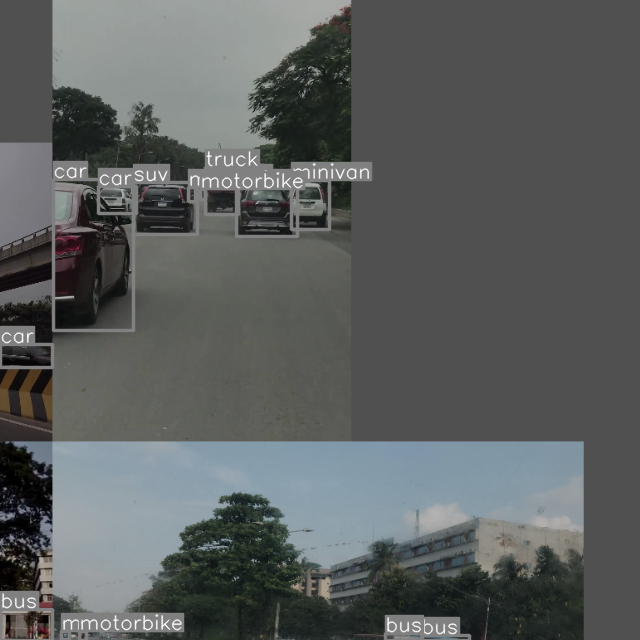

In [19]:
plot_with_bboxes(**batch, index=0)

That's ... weird looking. It's not what our original images look like, is it?

If it's not weird looking, try looking at another index. Eventually you'll find something weird looking!
The file names from the batch are stored in the im_file key. We can use that to look up the original image associated with this index and see what it looks like.

Display the original image file for this index.



In [20]:
batch['im_file'][0]

'C:\\Users\\MonsuratAyinde\\Desktop\\object_detection_with_yolo\\data_augmentation\\data_yolo\\images\\train\\Dipto_653.jpg'

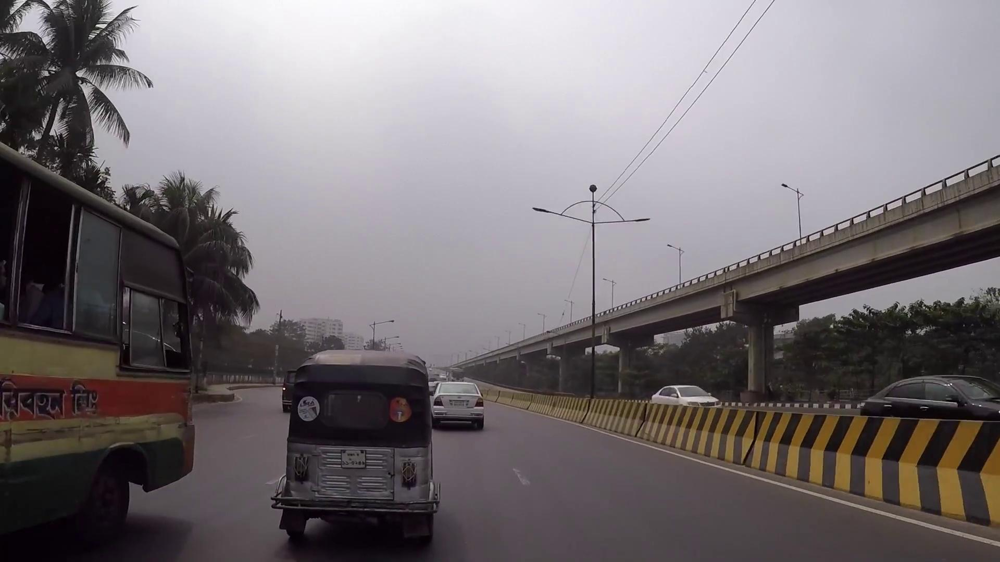

In [21]:
Image.open(batch['im_file'][0])

Comparing the two, we can see that the original image was distorted and combined with other images before being loaded into the YOLO model. The YOLO model applies a number of augmentation steps by default. (You can take a look at all of the augmentation settings in YOLO.) This increases the diversity of training images, which should help the model generally.

Data Augmentation with Torchvision

If you're training a YOLO model, it's generally best to use the built-in augmentation setting. But in other cases, you may need to implement an augmentation system yourself. Torchvision makes this easy by providing a number of augmentation transforms in its transforms version 2 (v2) module.

To demonstrate this, we'll load a sample image. The code below will get the file paths for 01.jpg and its associated label file. (It's written so that it works whether the image ended up in the training or validation split.)

In [22]:
yolo_base = pathlib.Path("data_yolo")
sample_fn = next((yolo_base / "images").glob("*/01.jpg"))
sample_labels = next((yolo_base / "labels").glob("*/01.txt"))

print(sample_fn)
print(sample_labels)

data_yolo\images\val\01.jpg
data_yolo\labels\val\01.txt


 Load the image with PIL.

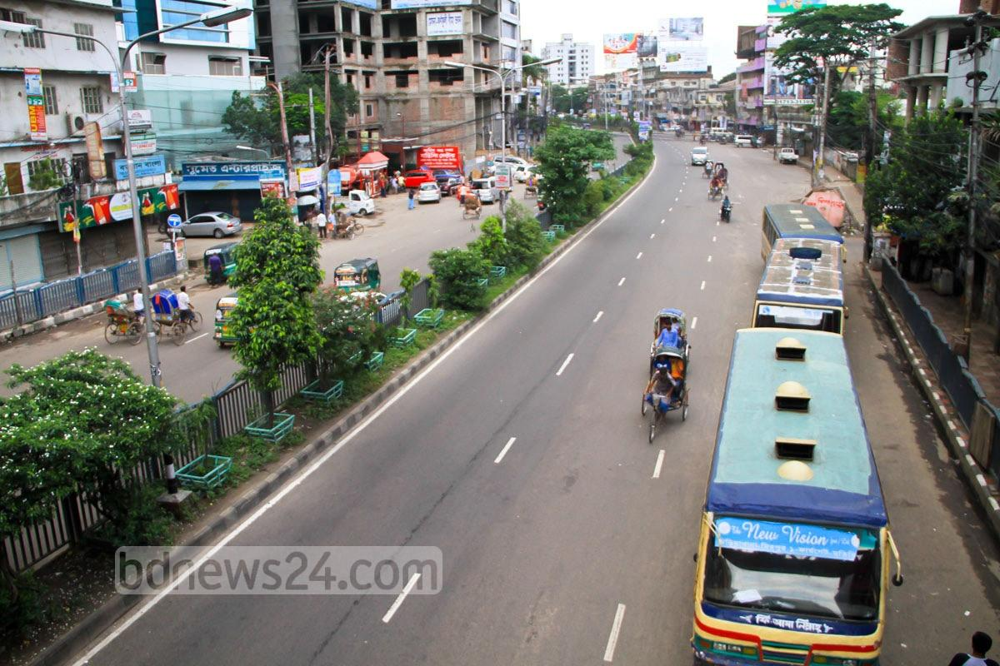

In [23]:
sample_image = Image.open(sample_fn)

sample_image

Convert the image to a tensor. In the transforms version 2 module, this can be done with the confusingly-named ToImage transform.

In [24]:
sample_torch = v2.ToImage()(sample_image)

print(sample_torch.shape)

torch.Size([3, 800, 1200])


The bounding boxes are stored in the label file. Let's take a look a the first five lines to remember what it looks like.

In [25]:
with open(sample_labels, 'r') as f:
    for _ in range(5):
        print(f.readline().strip())


4 0.8 0.74375 0.21166666666666667 0.5125
4 0.7995833333333333 0.424375 0.0975 0.13875
4 0.7995833333333333 0.33 0.08416666666666667 0.0575
13 0.66375 0.595625 0.059166666666666666 0.15875
13 0.66875 0.483125 0.0425 0.05625


Each line represents a bounding box. The first element is the class index. This is followed by the x and y coordinates of the box center, the width, and the height.

Load the bounding box data into a variable named label_data. It should be a list of the bounding boxes. Each bounding box will itself be a list of five strings in the same order they are in the file. Don't worry about converting the strings to numbers yet.

In [26]:
# Load the data into `label_data`
with open(sample_labels, "r") as f:
     label_data = [row.split() for row in f]

label_data[:5]

[['4', '0.8', '0.74375', '0.21166666666666667', '0.5125'],
 ['4', '0.7995833333333333', '0.424375', '0.0975', '0.13875'],
 ['4', '0.7995833333333333', '0.33', '0.08416666666666667', '0.0575'],
 ['13', '0.66375', '0.595625', '0.059166666666666666', '0.15875'],
 ['13', '0.66875', '0.483125', '0.0425', '0.05625']]

Create a tensor containing the class indices.  For compatibility with our plotting function it should be a $N\times 1$ tensor.

In [27]:
torch.Tensor([[int(row[0])] for row in label_data])

tensor([[ 4.],
        [ 4.],
        [ 4.],
        [13.],
        [13.],
        [13.],
        [13.],
        [13.],
        [13.],
        [13.],
        [13.],
        [13.],
        [10.],
        [ 5.],
        [ 5.],
        [ 5.],
        [17.],
        [17.],
        [17.],
        [11.],
        [17.],
        [ 9.],
        [ 5.],
        [ 9.],
        [15.],
        [15.],
        [ 9.],
        [13.],
        [19.],
        [11.]])

In [28]:
classes = torch.Tensor([[int(row[0])] for row in label_data])

print("Tensor shape:", classes.shape)
print("First 5 elements:\n", classes[:5])

Tensor shape: torch.Size([30, 1])
First 5 elements:
 tensor([[ 4.],
        [ 4.],
        [ 4.],
        [13.],
        [13.]])


Load the bounding box coordinates into a $N\times 4$ tensor.

In [32]:
[[float(el) for el in row[1:]]for row in label_data]

[[0.8, 0.74375, 0.21166666666666667, 0.5125],
 [0.7995833333333333, 0.424375, 0.0975, 0.13875],
 [0.7995833333333333, 0.33, 0.08416666666666667, 0.0575],
 [0.66375, 0.595625, 0.059166666666666666, 0.15875],
 [0.66875, 0.483125, 0.0425, 0.05625],
 [0.12375, 0.48375, 0.0475, 0.09],
 [0.17625, 0.474375, 0.05583333333333333, 0.09875],
 [0.4716666666666667, 0.31, 0.025, 0.0475],
 [0.71625, 0.281875, 0.0175, 0.03625],
 [0.7191666666666666, 0.249375, 0.015, 0.02125],
 [0.3466666666666667, 0.335, 0.035, 0.045],
 [0.5329166666666667, 0.280625, 0.0225, 0.03875],
 [0.7270833333333333, 0.318125, 0.015833333333333335, 0.03375],
 [0.21125, 0.335625, 0.059166666666666666, 0.04125],
 [0.4275, 0.2875, 0.03, 0.035],
 [0.41875, 0.2625, 0.029166666666666667, 0.0225],
 [0.23, 0.478125, 0.03666666666666667, 0.08875],
 [0.35625, 0.4125, 0.049166666666666664, 0.0575],
 [0.22625, 0.39625, 0.0525, 0.0675],
 [0.7883333333333333, 0.233125, 0.021666666666666667, 0.02625],
 [0.59875, 0.246875, 0.015833333333333335,

In [33]:
bboxes = torch.Tensor([[float(el) for el in row[1:]] for row in label_data])

print("Tensor shape:", bboxes.shape)
print("First 5 elements:\n", bboxes[:5])

Tensor shape: torch.Size([30, 4])
First 5 elements:
 tensor([[0.8000, 0.7437, 0.2117, 0.5125],
        [0.7996, 0.4244, 0.0975, 0.1388],
        [0.7996, 0.3300, 0.0842, 0.0575],
        [0.6637, 0.5956, 0.0592, 0.1587],
        [0.6687, 0.4831, 0.0425, 0.0562]])


All of these coordinates are normalized by the width or height, as appropriate. This won't work with transformations like rotation, which need the same units used on each axis.

Convert the bounding box coordinates to pixel units.

In [34]:
sample_width, sample_height = sample_image.size

scale_factor = torch.Tensor([sample_width, sample_height,
                            sample_width, sample_height])

bboxes_pixels = bboxes * scale_factor

print("Tensor shape:", bboxes_pixels.shape)
print("First 5 elements:\n", bboxes_pixels[:5])

Tensor shape: torch.Size([30, 4])
First 5 elements:
 tensor([[960.0000, 595.0000, 254.0000, 410.0000],
        [959.5000, 339.5000, 117.0000, 111.0000],
        [959.5000, 264.0000, 101.0000,  46.0000],
        [796.5000, 476.5000,  71.0000, 127.0000],
        [802.5000, 386.5000,  51.0000,  45.0000]])


In order for the transformations to know how to transform the bounding boxes, they need to know that the coordinates represent the centers and dimensions of the boxes. This is done by creating a special BoundingBoxes tensor. This type has a format attribute. By setting this to "CXCYWH", we're telling it that the columns represent the Center X coordinate, the Center Y coordinate, the Width, and the Height. This tensor also is given the size of the image, so it doesn't need to look that up for transformations.

In [35]:
bboxes_tv = torchvision.tv_tensors.BoundingBoxes(
    bboxes_pixels,
    format="CXCYWH",
    # Yes, that's right.  Despite using width x height everywhere
    # else, here we have to specify the image size as height x
    # width.
    canvas_size=(sample_height, sample_width),
)

print("Tensor type:", type(bboxes_tv))
print("First 5 elements:\n", bboxes_tv[:5])

Tensor type: <class 'torchvision.tv_tensors._bounding_boxes.BoundingBoxes'>
First 5 elements:
 tensor([[960.0000, 595.0000, 254.0000, 410.0000],
        [959.5000, 339.5000, 117.0000, 111.0000],
        [959.5000, 264.0000, 101.0000,  46.0000],
        [796.5000, 476.5000,  71.0000, 127.0000],
        [802.5000, 386.5000,  51.0000,  45.0000]])


Let's double check that we did all of those conversions correctly. Do the bounding boxes line up with the correct objects?

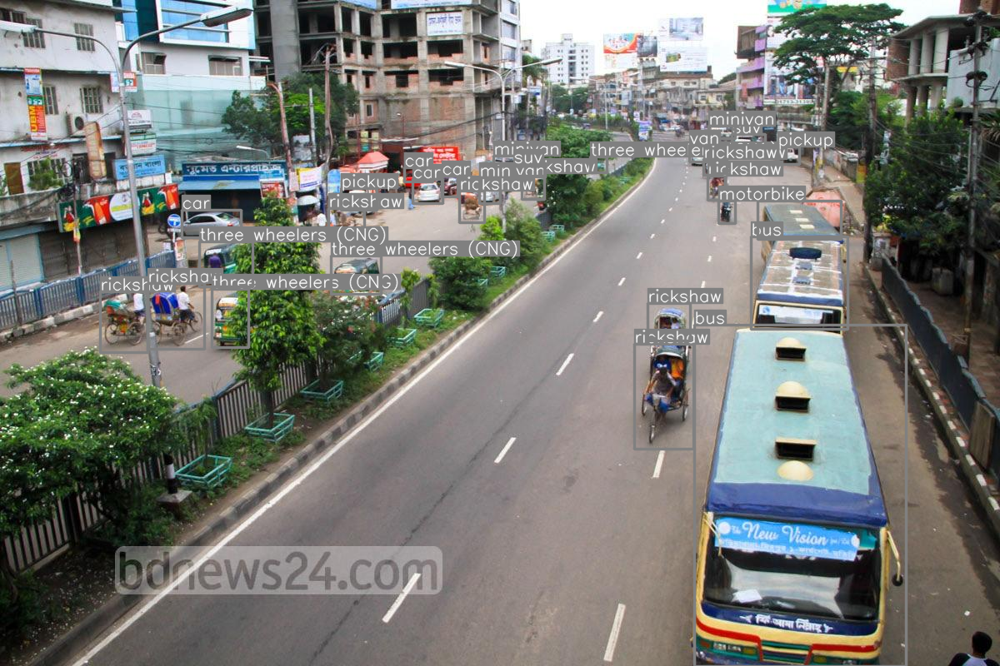

In [36]:
plot_with_bboxes(sample_torch, bboxes, classes)

If everything looks good, we'll introduce some transformations. The first one will be a horizontal flip. Many everyday objects have bilateral symmetry (or nearly so), so a flipped image will still have the same object classes in it. This makes a horizontal flip a good data augmentation transformation.

(In contrast, up/down symmetry is less common. A vertical flip is generally not as useful, unless you need to recognize upside-down objects.)

The transforms version 2 module has a RandomHorizontalFlip transformation. This takes the probability of a flip as an argument.

Use the RandomHorizontalFlip transformation to flip the sample image. Set p=1 to ensure that the flip happens

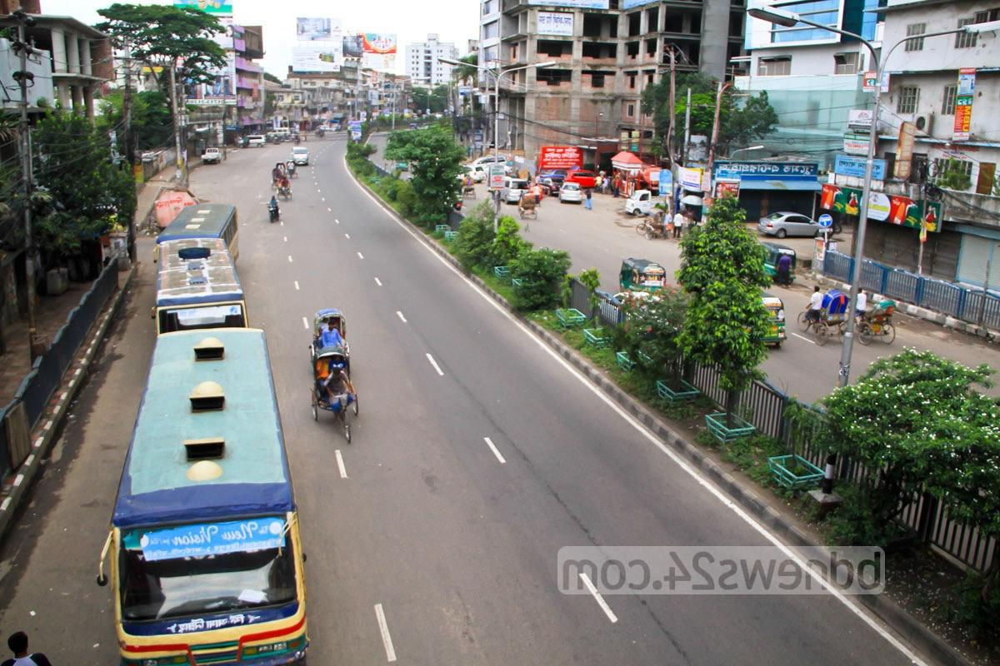

In [37]:
flipped = v2.RandomHorizontalFlip(p=1)(sample_torch)

plot_with_bboxes(flipped, bboxes_tv, classes)

The image has flipped, but the bounding boxes are still in their original locations. Note that the bus is now in the bottom left of the image. Its bounding box is still at the bottom right, and it now contains some asphalt, planters and trees. If we fed this into a model, it would make the model worse, by confusing it as to what a bus looks like.

So, we need to transform the bounding box coordinates consistent with the image transformation. The Torchvision version 2 transformations can take multiple arguments. They perform the same transformation on all of the arguments, returning a transformed version of each. They also understand how to correctly transform the BoundingBoxes tensors, depending on their type.

Use RandomHorizontalFlip to flip both the sample image and its bounding boxes. Check that they line up correctly now.

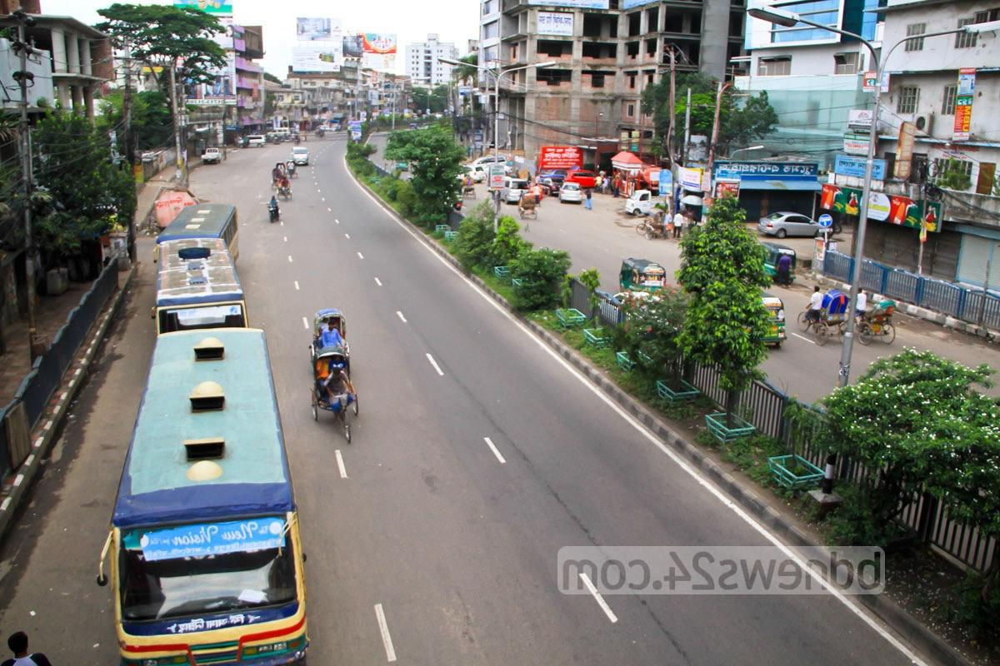

In [38]:
flipped, flipped_bboxes = v2.RandomHorizontalFlip(p=1)(sample_torch, bboxes_tv)

plot_with_bboxes(flipped, flipped_bboxes, classes)

## Note: All of these images are supposed to be showing bounding boxes

Apply the RandomRotation transformation. This takes an argument of the maximum number of degrees to rotate the image. Set it to 90.

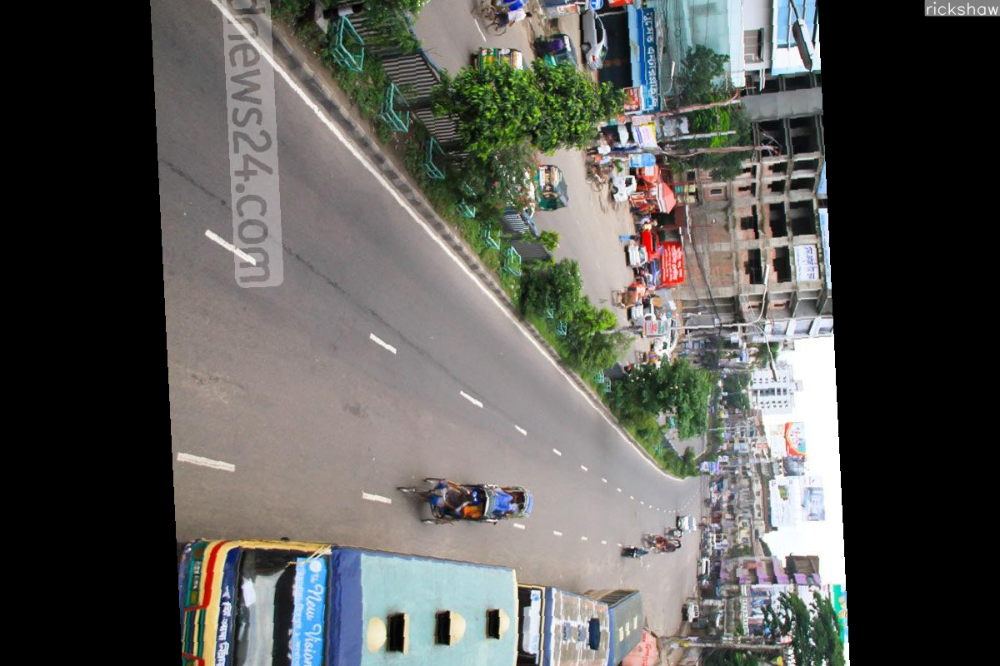

In [39]:
rotated, rotated_bboxes = v2.RandomRotation(90)(sample_torch, bboxes_tv)

plot_with_bboxes(rotated, rotated_bboxes, classes)

Multiple augmentation techniques can be chained together to produce even more diversity in the training images. Within Torchvision, this can be accomplished by the Compose element.

 Create an augmentation pipeline that combines the RandomHorizontalFlip with the RandomRotation. This time, set the probability of the flip to 50%.

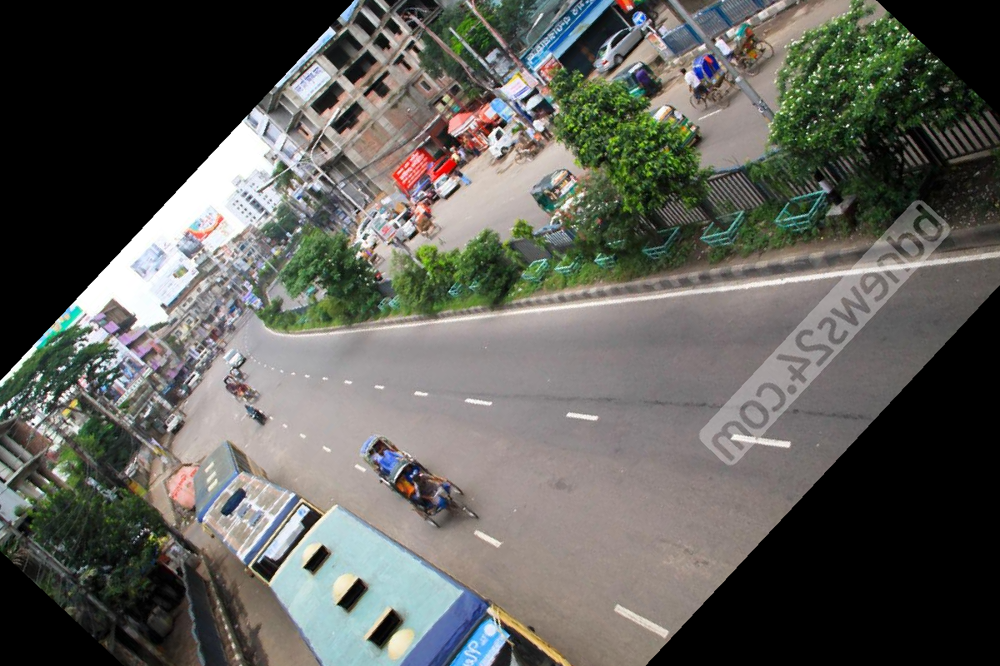

In [42]:
transforms = v2.Compose(
    [
        v2.RandomHorizontalFlip(p=0.5),
        v2.RandomRotation(degrees=90)
    ]
)

transformed, transformed_bboxes = transforms(sample_torch, bboxes_tv)

plot_with_bboxes(transformed, transformed_bboxes, classes)

There are a large number of transformations that can be used for data augmentation.  Scroll through [the documentation](https://pytorch.org/vision/stable/transforms.html#v2-api-reference-recommended) to get a view of the range of possibilities.

In addition to the transforms we've already used, note:
- [`RandomResizedCrop`](https://pytorch.org/vision/stable/generated/torchvision.transforms.v2.RandomResizedCrop.html#torchvision.transforms.v2.RandomResizedCrop) will randomly crop the image down, and then it resizes the output to a set dimension.
- [`ColorJitter`](https://pytorch.org/vision/stable/generated/torchvision.transforms.v2.ColorJitter.html#torchvision.transforms.v2.ColorJitter) can randomly adjust the brightness, contrast, saturation, and hue of the image, within specified ranges.

Create an augmentation pipeline that applies several of these transformations. Choose reasonable values for the parameters. Check that the bounding boxes are transformed correctly through this.

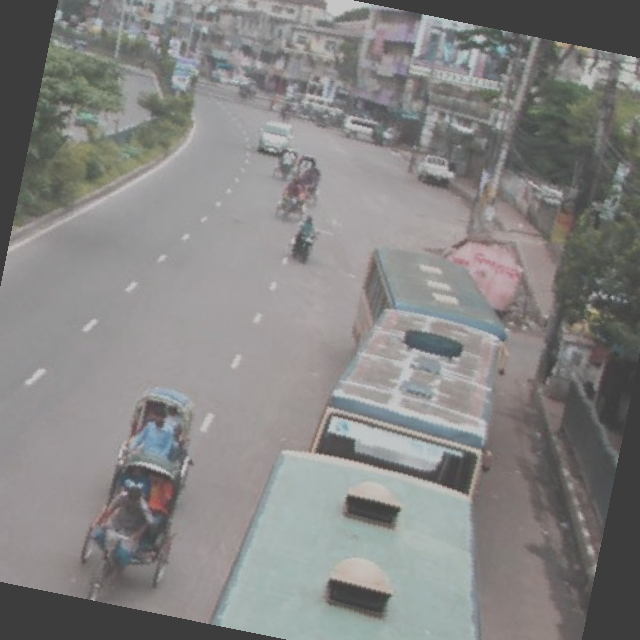

In [43]:
transforms = v2.Compose(
    [
        v2.RandomResizedCrop(size=(640, 640)),
        v2.RandomHorizontalFlip(p=0.5),
        v2.RandomRotation(degrees=30),
        v2.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.1),
    ]
)

transformed, transformed_bboxes = transforms(sample_torch, bboxes_tv)
plot_with_bboxes(transformed, transformed_bboxes, classes)


 By increasing the diversity of training images, data augmentation enhances a model's ability to generalize. This will increase their performance on unseen data, which is the ultimate goal of a machine learning system. In this process, we've learned: - How to get the data loader from a YOLO model. - The augmentation transforms that YOLO applies by default. - The Torchvision transforms to use for data augmentation. - Why both the images and the labels need to be transformed together. - How to compose several augmentation techniques.

When you are using pre-trained models like YOLO, you may not need to know all of these details. The default settings are pretty good, so you should probably leave them as-is at first. Adjust them only when you find a need for it. However, when you're working at a lower level on custom models, data augmentation will be up to you. Consider adding it to improve the performance of your model.